# Fine-Tuning en Computer Vision

## 📚 Introduction

### 🎯 Qu'est-ce que le Fine-Tuning ?

Le fine-tuning est une technique d'apprentissage par transfert qui consiste à :

1. **Partir d'un modèle pré-entraîné** (comme EfficientNetB7 entraîné sur ImageNet)
2. **Adapter ce modèle** à notre problème spécifique
3. **Réentraîner partiellement** le modèle sur nos données

### 💡 Pourquoi utiliser le Fine-Tuning ?

✅ **Moins de données nécessaires** : Utilise les connaissances déjà apprises

✅ **Entraînement plus rapide** : Pas besoin de partir de zéro

✅ **Meilleures performances** : Combine les features génériques et spécifiques

✅ **Moins de ressources** : Économise du temps de calcul

### 🌺 Notre Projet

Dans ce notebook, nous allons :
- Classifier 5 types de fleurs différentes
- Utiliser le modèle EfficientNetB7 pré-entraîné
- Appliquer deux phases d'entraînement
- Visualiser nos résultats à chaque étape

---

## 🔧 Configuration et Imports

Commençons par importer toutes les bibliothèques nécessaires et configurer notre environnement.

In [3]:
# Imports principaux
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import warnings
warnings.filterwarnings('ignore')

# Configuration pour un meilleur affichage
plt.style.use('default')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

print(f"🚀 TensorFlow version: {tf.__version__}")
print(f"💻 GPU disponible: {'✅ Oui' if len(tf.config.list_physical_devices('GPU')) > 0 else '❌ Non'}")

🚀 TensorFlow version: 2.19.0
💻 GPU disponible: ✅ Oui


### 🖥️ Configuration GPU

Si vous avez un GPU, nous allons le configurer pour éviter les erreurs de mémoire :

In [4]:
# Configuration GPU pour éviter les erreurs OOM (Out of Memory)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Limiter la croissance de la mémoire GPU
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("✅ Configuration GPU réussie - Croissance mémoire activée")
    except RuntimeError as e:
        print(f"⚠️ Erreur configuration GPU: {e}")
else:
    print("🔧 Utilisation du CPU - Pas de GPU détecté")

⚠️ Erreur configuration GPU: Physical devices cannot be modified after being initialized


### ⚙️ Paramètres d'Entraînement

Définissons les paramètres principaux de notre modèle :

In [5]:
# 📊 Paramètres du modèle
BATCH_SIZE = 32        # Nombre d'images traitées en même temps
IMG_SIZE = 600         # Taille standard pour EfficientNetB7 (600x600 pixels)
EPOCHS = 300           # Nombre d'époques d'entraînement
EPOCHS_TUNING = 100           # Nombre d'époques d'entraînement
LEARNING_RATE = 0.001 # Taux d'apprentissage initial
ACCURACY = 'sparse_categorical_accuracy' # accuracy par classes
VAL_ACCURACY = 'val_' + ACCURACY

print("📋 Configuration d'entraînement:")
print(f"   • Taille de batch: {BATCH_SIZE}")
print(f"   • Taille d'image: {IMG_SIZE}x{IMG_SIZE} pixels")
print(f"   • Nombre d'époques: {EPOCHS}")
print(f"   • Nombre d'époques de tuning: {EPOCHS_TUNING}")
print(f"   • Taux d'apprentissage: {LEARNING_RATE}")

# Explication pédagogique
print("\n🎓 Explication des paramètres:")
print("   🔹 BATCH_SIZE: Plus il est grand, plus l'entraînement est stable mais consomme plus de mémoire")
print("   🔹 IMG_SIZE: Doit correspondre à la taille attendue par le modèle pré-entraîné")
print("   🔹 LEARNING_RATE: Petit pour le fine-tuning pour éviter de 'casser' les features pré-entraînées")

📋 Configuration d'entraînement:
   • Taille de batch: 32
   • Taille d'image: 600x600 pixels
   • Nombre d'époques: 300
   • Nombre d'époques de tuning: 100
   • Taux d'apprentissage: 0.001

🎓 Explication des paramètres:
   🔹 BATCH_SIZE: Plus il est grand, plus l'entraînement est stable mais consomme plus de mémoire
   🔹 IMG_SIZE: Doit correspondre à la taille attendue par le modèle pré-entraîné
   🔹 LEARNING_RATE: Petit pour le fine-tuning pour éviter de 'casser' les features pré-entraînées


## 🌺 Chargement des Données - Dataset

Nous allons utiliser le dataset :

https://www.kaggle.com/code/fulrose/3rd-ml-month-car-model-classification-baseline

après sélection d'un sous ensemble tel que :

- **70 classes** de voitures
- **~4629 images** au total
- **Images de tailles variables** (nous les redimensionnerons)
- **Dataset supervisé** (chaque image a son label)

In [6]:
# 🌸 Chargement du dataset
ds_train, ds_val = keras.preprocessing.image_dataset_from_directory(
    '/home/fry/Projet/DL/cars/archive/train',
    seed=666,
    interpolation='nearest',
    batch_size=None,
    image_size=(IMG_SIZE,IMG_SIZE),
    labels='inferred',
    label_mode='int',
    #color_mode='grayscale',
    validation_split=0.15,
    subset='both'
)

# 📊 Informations sur le dataset
class_names=ds_train.class_names
num_classes=len(class_names)

ds_test = keras.preprocessing.image_dataset_from_directory(
    '/home/fry/Projet/DL/cars/archive/test',
    seed=123,
    interpolation='nearest',
    batch_size=None,
    image_size=(IMG_SIZE,IMG_SIZE),
    labels='inferred',
    label_mode='int',
    #color_mode='grayscale'
)

print(f"✅ Dataset chargé avec succès !")
print(f"📈 Nombre de classes: {num_classes}")
print(f"🏷️ Noms des classes: {class_names}")
print(f"📊 Total d'exemples: {len(ds_train)}")


Found 5445 files belonging to 70 classes.
Using 4629 files for training.
Using 816 files for validation.
Found 16724 files belonging to 947 classes.
✅ Dataset chargé avec succès !
📈 Nombre de classes: 70
🏷️ Noms des classes: ['2009_Toyota_iQ', '2014_BMW_4_Series_Convertible_F33', '2014_Lexus_IS', '2019_Hyundai_Santa_Fe', '2020_Mazda_MX30', '2021_Chrysler_Pacifica', '2021_MercedesBenz_GLA', '2023_BMW_i7', '2024_BMW_M3_CS', '2024_BMW_X6', 'AUDI_A1_Sportback_5_doors_20122015', 'AUDI_A5_20072011', 'AUDI_A6_2018Present', 'AUDI_etron_Sportback_2019Present', 'BENTLEY_BENTAYGA_HYBRID_2018Present', 'BENTLEY_Continental_GTC_20112013', 'BMW_1_Series_3_doors_LCI_F21_20152017', 'BMW_1_Series_F20_20112015', 'BMW_1_Series_LCI_F20_20152017', 'BMW_2_Series_Active_Tourer_2021Present', 'BMW_3Series_Touring_2022Present', 'BMW_3_Series_E90_20082011', 'BMW_4_Series_Coupe_G22_2020Present', 'BMW_M3_Touring_2022Present', 'BMW_M5_CS_2021Present', 'BMW_X4_20182021', 'BMW_X4_M_F98_2021Present', 'BMW_Z4_Roadster_L

### 🔍 Exploration du Dataset

Regardons la répartition des données et comprenons la structure :

In [7]:
# 📊 Compter les échantillons dans chaque split
train_size = len(ds_train)
val_size = len(ds_val)

print("📋 Répartition des données:")
print(f"   🎯 Entraînement: {train_size} images ({train_size/(train_size+val_size)*100:.1f}%)")
print(f"   ✅ Validation: {val_size} images ({val_size/(train_size+val_size)*100:.1f}%)")
print(f"   📊 Total: {train_size + val_size} images")

# 🖼️ Examiner une image d'exemple
print("\n🔍 Exemple d'image du dataset:")
for image, label in ds_train.take(1):
    print(label)
    print(f"   📐 Forme de l'image: {image.shape}")
    print(f"   🎨 Type de données: {image.dtype}")
    #print(f"   🏷️ Label: {label.numpy()} ({class_names[label.numpy()]})")
    print(f"   📊 Valeurs pixel min/max: {tf.reduce_min(image).numpy()}/{tf.reduce_max(image).numpy()}")

📋 Répartition des données:
   🎯 Entraînement: 4629 images (85.0%)
   ✅ Validation: 816 images (15.0%)
   📊 Total: 5445 images

🔍 Exemple d'image du dataset:
tf.Tensor(47, shape=(), dtype=int32)
   📐 Forme de l'image: (600, 600, 3)
   🎨 Type de données: <dtype: 'uint8'>
   📊 Valeurs pixel min/max: 0/255


2025-07-20 16:13:52.759062: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


## 🛠️ Préparation des Données

Avant d'entraîner notre modèle, nous devons préparer nos données :

1. **Redimensionner** les images à 600x600 (taille attendue par EfficientNetB7)
2. **Normaliser** les pixels selon EfficientNetB7
3. **Augmenter** les données d'entraînement
4. **Optimiser** les performances avec batching et prefetching

In [8]:
# 🔧 Fonction de préprocessing
def preprocess_image(image, label):
    """
    Préprocesse une image pour EfficientNetB7
    
    Args:
        image: Tensor d'image (hauteur, largeur, 3)
        label: Label de l'image
    
    Returns:
        image: Image préprocessée (600, 600, 3)
        label: Label inchangé
    """
    # ✂️ Redimensionnement à 600x600
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    
    # 🎨 Préprocessing spécifique à MobileNetV2
    # Convertit les pixels de [0, 255] vers [-1, 1]
    #image = tf.keras.applications.efficientnet.preprocess_input(image)
    
    return image, label

print("✅ Fonction de préprocessing définie")
print("   🔄 Redimensionnement: Variable → 600x600")
#print("   📊 Normalisation: [0, 255] → [-1, 1]")

✅ Fonction de préprocessing définie
   🔄 Redimensionnement: Variable → 600x600


### 🎲 Data Augmentation

L'augmentation de données aide à améliorer la généralisation en créant des variations des images d'entraînement :

In [9]:
# 🎲 Couches d'augmentation de données
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),        # Retournement horizontal aléatoire
    layers.RandomRotation(0.3),             # Rotation aléatoire ±20%
    layers.RandomZoom(0.2),                 # Zoom aléatoire ±10%
], name="data_augmentation")

def augment_image(image, label):
    """
    Applique l'augmentation de données pendant l'entraînement
    """
    image = data_augmentation(image, training=True)
    return image, label

print("🎲 Augmentation de données configurée:")
print("   ↔️ Retournement horizontal aléatoire")
print("   🔄 Rotation aléatoire (±36°)")
print("   🔍 Zoom aléatoire (±10%)")
print("\n💡 Pourquoi augmenter les données ?")
print("   • Augmente artificiellement la taille du dataset")
print("   • Améliore la généralisation du modèle")
print("   • Réduit le surapprentissage (overfitting)")

🎲 Augmentation de données configurée:
   ↔️ Retournement horizontal aléatoire
   🔄 Rotation aléatoire (±36°)
   🔍 Zoom aléatoire (±10%)

💡 Pourquoi augmenter les données ?
   • Augmente artificiellement la taille du dataset
   • Améliore la généralisation du modèle
   • Réduit le surapprentissage (overfitting)


### 📊 Application du Pipeline de Données

Maintenant, appliquons toutes nos transformations aux datasets :

In [10]:
# ⚡ Configuration pour l'optimisation des performances
AUTOTUNE = tf.data.AUTOTUNE

print("🔧 Application du pipeline de préparation des données...\n")

# 🎯 Dataset d'entraînement avec augmentation
print("📋 Pipeline d'entraînement:")
ds_train_processed = ds_train.map(preprocess_image, num_parallel_calls=AUTOTUNE)
print("   ✅ 1. Préprocessing appliqué")

ds_train_processed = ds_train_processed.map(augment_image, num_parallel_calls=AUTOTUNE)
print("   ✅ 2. Augmentation appliquée")

ds_train_processed = ds_train_processed.batch(BATCH_SIZE)
print("   ✅ 3. Batching appliqué")

ds_train_processed = ds_train_processed.prefetch(AUTOTUNE)
print("   ✅ 4. Prefetching appliqué")

# 🎯 Dataset de validation SANS augmentation
print("\n📋 Pipeline de validation:")
ds_val_processed = ds_val.map(preprocess_image, num_parallel_calls=AUTOTUNE)
print("   ✅ 1. Préprocessing appliqué (SANS augmentation)")

ds_val_processed = ds_val_processed.batch(BATCH_SIZE)
print("   ✅ 2. Batching appliqué")

ds_val_processed = ds_val_processed.prefetch(AUTOTUNE)
print("   ✅ 3. Prefetching appliqué")

print("\n💡 Pourquoi pas d'augmentation en validation ?")
print("   • La validation doit être reproductible")
print("   • Nous voulons évaluer sur les données 'réelles'")
print("   • L'augmentation ne sert qu'à enrichir l'entraînement")

🔧 Application du pipeline de préparation des données...

📋 Pipeline d'entraînement:
   ✅ 1. Préprocessing appliqué
   ✅ 2. Augmentation appliquée
   ✅ 3. Batching appliqué
   ✅ 4. Prefetching appliqué

📋 Pipeline de validation:
   ✅ 1. Préprocessing appliqué (SANS augmentation)
   ✅ 2. Batching appliqué
   ✅ 3. Prefetching appliqué

💡 Pourquoi pas d'augmentation en validation ?
   • La validation doit être reproductible
   • Nous voulons évaluer sur les données 'réelles'
   • L'augmentation ne sert qu'à enrichir l'entraînement


## 🎨 Visualisation des Données

Visualisons nos données avant et après préprocessing pour bien comprendre les transformations :

In [11]:
def show_batch(dataset, title="Batch d'images", num_images=9, figsize=(12, 12)):
    """
    Visualise un batch d'images avec leurs labels
    
    Args:
        dataset: Dataset TensorFlow
        title: Titre du graphique
        num_images: Nombre d'images à afficher
        figsize: Taille de la figure
    """
    plt.figure(figsize=figsize)
    plt.suptitle(title, fontsize=16, fontweight='bold')
    
    for images, labels in dataset.take(1):
        for i in range(min(num_images, len(images))):
            ax = plt.subplot(3, 3, i + 1)
            
            # Récupérer et préparer l'image pour l'affichage
            image = images[i].numpy()
            
            # Si l'image est normalisée [-1, 1], la ramener à [0, 1]
            if image.min() < 0:
                image = (image + 1) / 2
            
            # Si les valeurs sont > 1, normaliser
            if image.max() > 1:
                image = image / 255.0
            
            plt.imshow(image)
            plt.title(f"{class_names[labels[i]]}", fontsize=12, pad=10)
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()

print("🎨 Fonction de visualisation créée")

🎨 Fonction de visualisation créée


### 🖼️ Images Originales

Regardons d'abord les images telles qu'elles sont dans le dataset original :

🌸 Aperçu des images originales du dataset:
ℹ️ Note: Images redimensionnées à 600x600 pour permettre l'affichage en batch


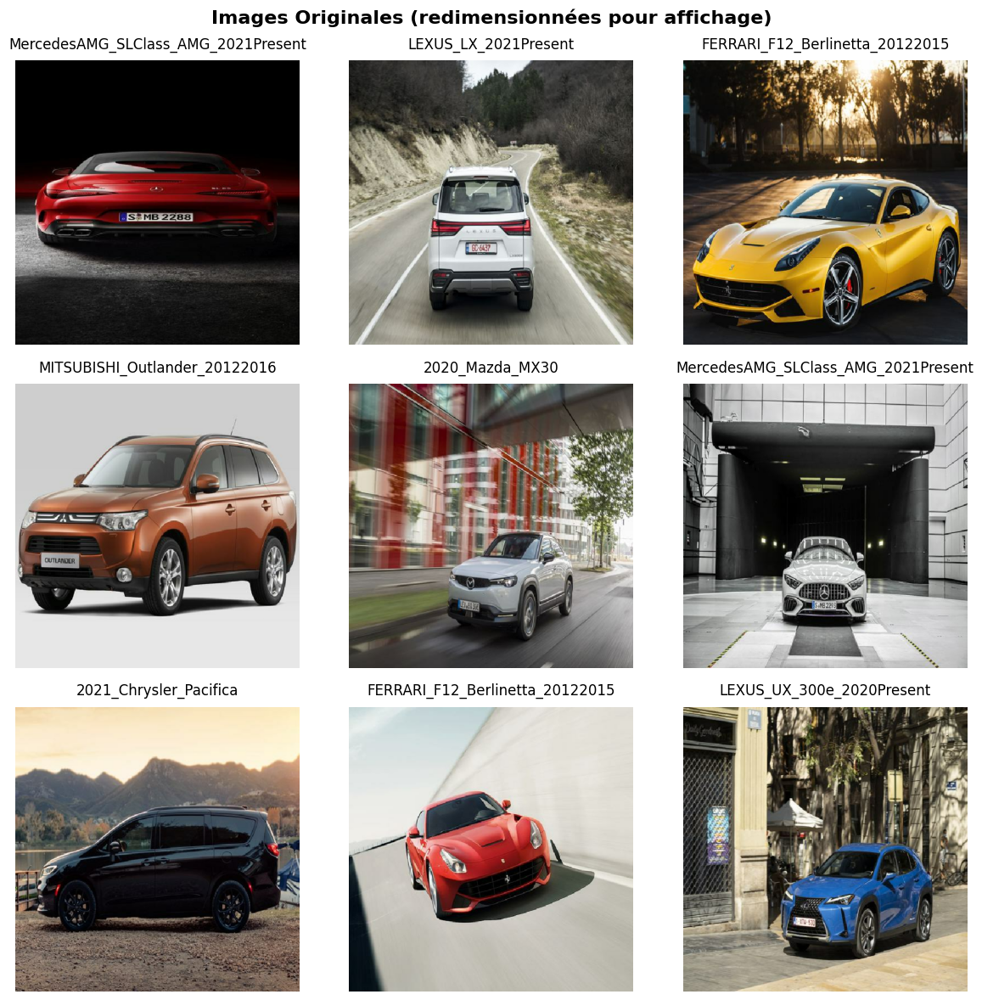

In [35]:
# 🖼️ Fonction de redimensionnement simple pour la visualisation
def resize_for_display(image, label):
    """Redimensionne uniquement pour l'affichage (pas de normalisation)"""
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

# 🖼️ Affichage des images originales (redimensionnées pour l'affichage)
print("🌸 Aperçu des images originales du dataset:")
print(f"ℹ️ Note: Images redimensionnées à {IMG_SIZE}x{IMG_SIZE} pour permettre l'affichage en batch")
ds_train_display = ds_train.map(resize_for_display).batch(9)
show_batch(ds_train_display, title="Images Originales (redimensionnées pour affichage)")

### 🔄 Images Après Préprocessing

Maintenant, voyons les mêmes images après redimensionnement et normalisation :

🔧 Aperçu après préprocessing (redimensionnement + normalisation):


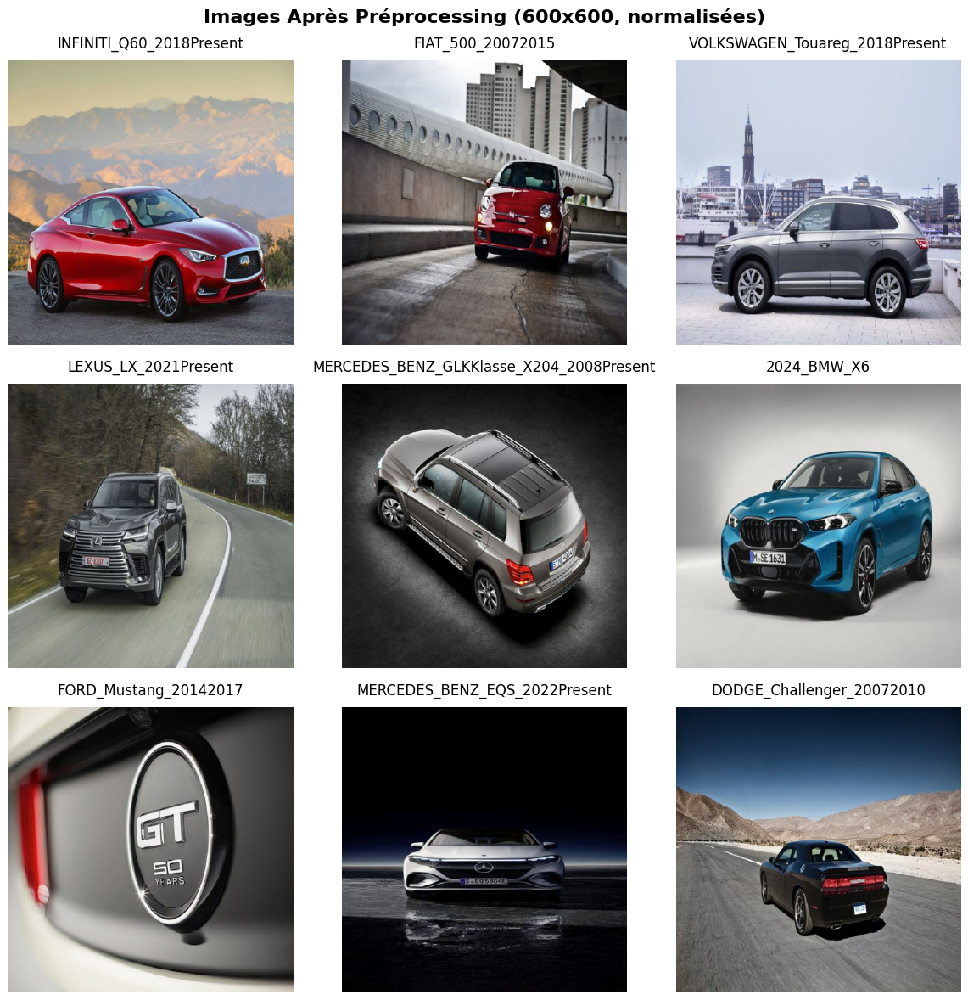

In [42]:
# 🔄 Affichage après préprocessing (sans augmentation)
ds_preprocessed_only = ds_train.map(preprocess_image).batch(9)
print("🔧 Aperçu après préprocessing (redimensionnement + normalisation):")
show_batch(ds_preprocessed_only, title=f"Images Après Préprocessing ({IMG_SIZE}x{IMG_SIZE}, normalisées)")

### 🎲 Effet de l'Augmentation de Données

Comparons la même image avant et après augmentation pour voir l'effet des transformations :

🎲 Démonstration de l'augmentation de données:


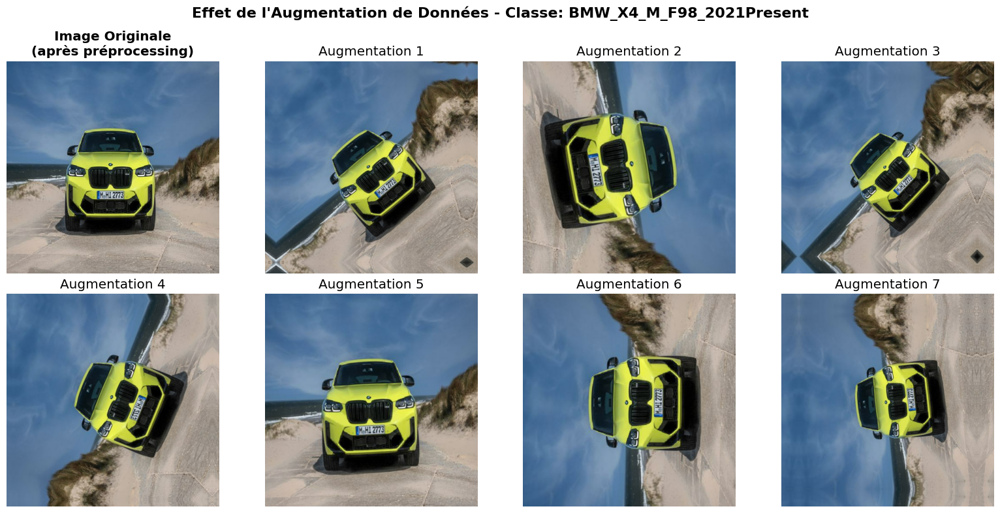


💡 Observations sur l'augmentation:
   🔄 Chaque version est légèrement différente
   📊 Cela multiplie artificiellement notre dataset
   🎯 Le modèle apprend à être plus robuste aux variations


In [39]:
# 🎲 Démonstration de l'augmentation de données
def show_augmentation_effect():
    """
    Montre l'effet de l'augmentation sur une même image
    """
    # Prendre une seule image
    for original_image, label in ds_train.take(1):
        # Préprocesser l'image
        processed_image, _ = preprocess_image(original_image, label)
        
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle(f"Effet de l'Augmentation de Données - Classe: {class_names[label]}", 
                    fontsize=16, fontweight='bold')
        
        # Image originale préprocessée
        axes[0, 0].imshow((processed_image / 255))
        axes[0, 0].set_title("Image Originale\n(après préprocessing)", fontweight='bold')
        axes[0, 0].axis('off')
        
        # Générer plusieurs versions augmentées
        for i in range(1, 4):
            augmented_image, _ = augment_image(processed_image, label)
            axes[0, i].imshow((augmented_image / 255))
            axes[0, i].set_title(f"Augmentation {i}")
            axes[0, i].axis('off')
        
        # Encore plus d'exemples
        for i in range(4):
            augmented_image, _ = augment_image(processed_image, label)
            axes[1, i].imshow((augmented_image / 255))
            axes[1, i].set_title(f"Augmentation {i+4}")
            axes[1, i].axis('off')
        
        plt.tight_layout()
        plt.show()
        break

print("🎲 Démonstration de l'augmentation de données:")
show_augmentation_effect()

print("\n💡 Observations sur l'augmentation:")
print("   🔄 Chaque version est légèrement différente")
print("   📊 Cela multiplie artificiellement notre dataset")
print("   🎯 Le modèle apprend à être plus robuste aux variations")

### 📊 Aperçu Final des Données d'Entraînement

Regardons maintenant un batch complet tel qu'il sera fourni au modèle :

🎯 Aperçu final du dataset d'entraînement (avec toutes les transformations):


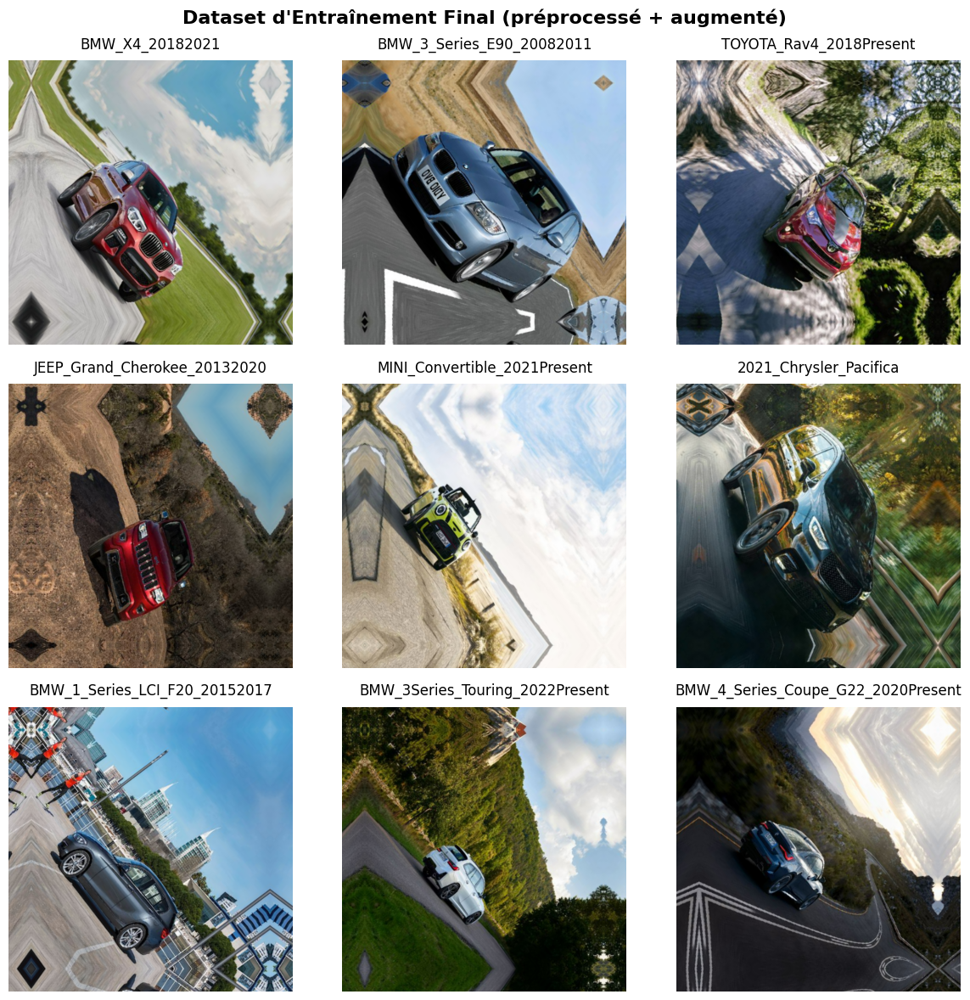


📋 Résumé de ce que le modèle va recevoir:
   📐 Taille: 600x600x3 pixels
   📊 Valeurs: [0, 255] (normalisées pour EfficientNetB7)
   🎲 Variété: Augmentées aléatoirement à chaque époque
   📦 Batch: 32 images à la fois


In [41]:
# 📊 Affichage du dataset final d'entraînement
print("🎯 Aperçu final du dataset d'entraînement (avec toutes les transformations):")
show_batch(ds_train_processed, title="Dataset d'Entraînement Final (préprocessé + augmenté)")

print("\n📋 Résumé de ce que le modèle va recevoir:")
print(f"   📐 Taille: {IMG_SIZE}x{IMG_SIZE}x3 pixels")
print("   📊 Valeurs: [0, 255] (normalisées pour EfficientNetB7)")
print("   🎲 Variété: Augmentées aléatoirement à chaque époque")
print("   📦 Batch: 32 images à la fois")

## 🧠 Création du Modèle avec Transfer Learning

Maintenant que nos données sont prêtes, créons notre modèle basé sur EfficientNetB7 pré-entraîné.

### 🎯 Qu'est-ce que EfficientNetB7 ?

- **Pré-entraîné sur ImageNet** (1.4M d'images, 1000 classes)
- **Excellent équilibre** entre performance et vitesse
- **Idéal pour le fine-tuning** sur de nouveaux domaines

In [15]:
# 🧠 Chargement du modèle de base EfficientNetB7
print("🚀 Chargement de EfficientNetB7 pré-entraîné...")


base_model = tf.keras.applications.EfficientNetB7(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),  # Forme d'entrée
    include_top=False,                    # Exclure la couche de classification finale
    weights='imagenet'                    # Utiliser les poids pré-entraînés ImageNet
)

#base_model = tf.keras.applications.ResNet50V2(
#    input_shape=(IMG_SIZE, IMG_SIZE, 3),  # Forme d'entrée
#    include_top=False,                    # Exclure la couche de classification finale
#    weights='imagenet'                    # Utiliser les poids pré-entraînés ImageNet
#)

# 🔒 Geler les couches du modèle de base (transfer learning)
base_model.trainable = False

print("✅ EfficientNetB7 chargé avec succès !")
print(f"📊 Nombre de couches: {len(base_model.layers)}")
print(f"📐 Forme de sortie: {base_model.output_shape}")
print(f"🔒 Couches gelées: {not base_model.trainable}")

# 💡 Explication pédagogique
print("\n🎓 Pourquoi geler les couches ?")
print("   • Les features bas niveau (bords, textures) sont déjà bien apprises")
print("   • Évite de 'casser' les représentations pré-entraînées")
print("   • Accélère l'entraînement initial")
print("   • Nous dégelerons certaines couches plus tard (fine-tuning)")

🚀 Chargement de EfficientNetB7 pré-entraîné...
✅ EfficientNetB7 chargé avec succès !
📊 Nombre de couches: 814
📐 Forme de sortie: (None, 19, 19, 2560)
🔒 Couches gelées: True

🎓 Pourquoi geler les couches ?
   • Les features bas niveau (bords, textures) sont déjà bien apprises
   • Évite de 'casser' les représentations pré-entraînées
   • Accélère l'entraînement initial
   • Nous dégelerons certaines couches plus tard (fine-tuning)


### 🏗️ Architecture Complète du Modèle

Ajoutons nos propres couches au-dessus du modèle pré-entraîné :

In [16]:
# 🏗️ Construction du modèle complet
print("🔧 Construction de l'architecture complète...")

# Couche d'entrée
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# Modèle de base (gelé)
x = base_model(inputs, training=False)  # training=False pour utiliser en mode inférence

# Pooling global pour réduire les dimensions
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Dense layers
x = tf.keras.layers.Dense(512, kernel_regularizer=keras.regularizers.l2(1e-4))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.94)(x)

# Couche de classification finale
outputs = tf.keras.layers.Dense(num_classes, activation='softmax', kernel_regularizer=keras.regularizers.l2(1e-4))(x)

# Création du modèle final
model = tf.keras.Model(inputs, outputs)

print("✅ Modèle créé avec succès !")

# Calculer les paramètres de manière compatible TensorFlow
total_params = model.count_params()
trainable_params = sum(tf.size(var).numpy() for var in model.trainable_variables)
frozen_params = total_params - trainable_params

print(f"📊 Nombre total de paramètres: {total_params:,}")
print(f"🎯 Paramètres entraînables: {trainable_params:,}")
print(f"🔒 Paramètres gelés: {frozen_params:,}")

🔧 Construction de l'architecture complète...
✅ Modèle créé avec succès !
📊 Nombre total de paramètres: 65,446,877
🎯 Paramètres entraînables: 1,348,166
🔒 Paramètres gelés: 64,098,711


### 📋 Résumé de l'Architecture

Visualisons l'architecture de notre modèle :

In [ ]:
# 📋 Affichage du résumé du modèle
print("🏗️ Architecture du modèle:")
model.summary()

print("\n🎓 Explication de l'architecture:")
print(f"   📥 Input ({IMG_SIZE} ,{IMG_SIZE} , 3): Image d'entrée") 
print("   🧠 EfficientNetB7: Extraction de features (gelé)")
print("   🌐 GlobalAveragePooling2D: Réduction dimensionnelle")
print("   🎯 Dense(512) + Regularizers.L2")
print("   🌐 BatchNormalization")
print("   🌐 Activation('relu')")
print("   🎲 Dropout(0.94): Régularisation (94% de neurones désactivés)")
print(f"   🎯 Dense({num_classes}, softmax): Classification finale ({num_classes} classes de voitures)")

🏗️ Architecture du modèle:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 600, 600, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb7 (Functional)     │ (None, 19, 19, 2560)   │    64,097,687 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2560)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,311,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 70)             │        35,910 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 111,577,131 (425.63 MB)

 Trainable params: 23,065,126 (87.99 MB)

 Non-trainable params: 42,381,751 (161.67 MB)

 Optimizer params: 46,130,254 (175.97 MB)


🎓 Explication de l'architecture:
   📥 Input (600 ,600 , 3): Image d'entrée
   🧠 EfficientNetB7: Extraction de features (gelé)
   🌐 GlobalAveragePooling2D: Réduction dimensionnelle
   🌐 Dense(512) + Regularizers.L2
   🌐 BatchNormalization
   🌐 Activation('relu')
   🎲 Dropout(0.94): Régularisation (94% de neurones désactivés)
   🎯 Dense(70, softmax): Classification finale (70 classes de voitures)


### 🎯 Visualisation de l'Architecture

Créons un diagramme pour mieux comprendre notre modèle :

🎨 Visualisation de l'architecture du modèle:


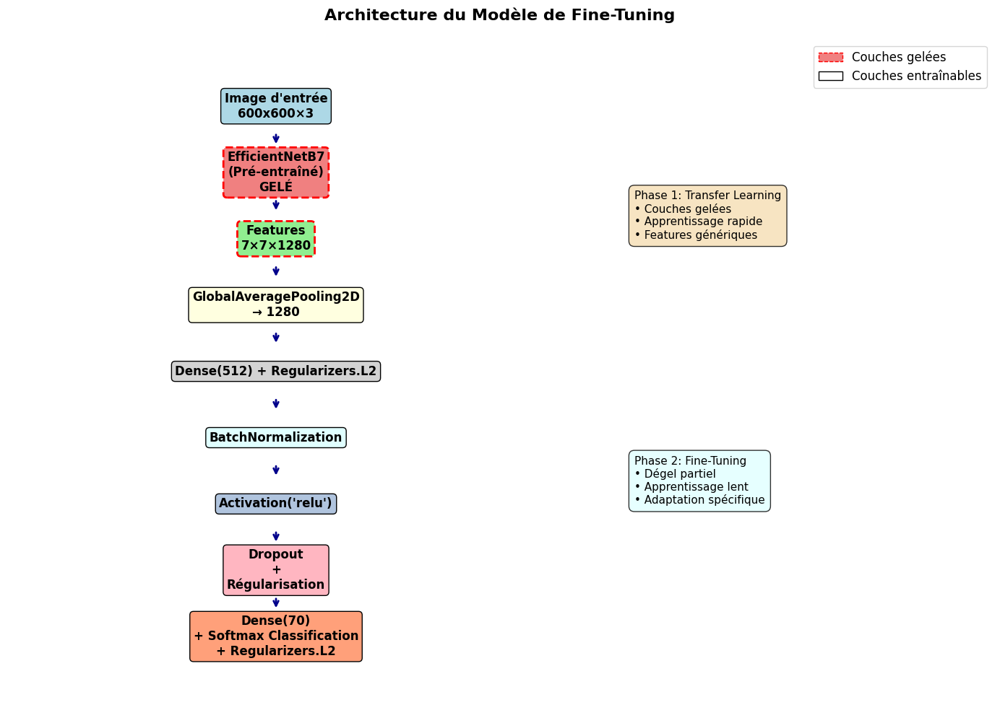


💡 Points clés de l'architecture:
   🔒 EfficientNetB7 gelé: Préserve les features pré-apprises
   🎯 Nouvelles couches: Adaptées à notre problème (5 classes)
   ⚡ Efficace: Peu de paramètres à entraîner initialement
   🎲 Régularisation: Dropout pour éviter l'overfitting


In [23]:
# 🎨 Visualisation de l'architecture
def visualize_model_architecture():
    """
    Crée un diagramme explicatif de l'architecture
    """
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))
    
    # Définir les composants et leurs positions
    components = [
        {"name": f"Image d'entrée\n{IMG_SIZE}x{IMG_SIZE}×3", "pos": (1, 8), "color": "lightblue", "frozen": False},
        {"name": "EfficientNetB7\n(Pré-entraîné)\nGELÉ", "pos": (1, 7), "color": "lightcoral", "frozen": True},
        {"name": "Features\n7×7×1280", "pos": (1, 6), "color": "lightgreen", "frozen": True},
        {"name": "GlobalAveragePooling2D\n→ 1280", "pos": (1, 5), "color": "lightyellow", "frozen": False},
        {"name": "Dense(512) + Regularizers.L2", "pos": (1, 4), "color": "lightgray", "frozen": False},
        {"name": "BatchNormalization", "pos": (1, 3), "color": "lightcyan", "frozen": False},
        {"name": "Activation('relu')", "pos": (1, 2), "color": "lightsteelblue", "frozen": False},
        {"name": "Dropout\n+\nRégularisation", "pos": (1, 1), "color": "lightpink", "frozen": False},
        {"name": f"Dense({num_classes})\n+ Softmax Classification\n+ Regularizers.L2", "pos": (1, 0), "color": "lightsalmon", "frozen": False}
    ]
    
    # Dessiner les composants
    for i, comp in enumerate(components):
        x, y = comp["pos"]
        
        # Style différent pour les couches gelées
        if comp["frozen"]:
            bbox_props = dict(boxstyle="round,pad=0.3", facecolor=comp["color"], 
                            edgecolor="red", linewidth=2, linestyle="--")
        else:
            bbox_props = dict(boxstyle="round,pad=0.3", facecolor=comp["color"], 
                            edgecolor="black", linewidth=1)
        
        ax.text(x, y, comp["name"], ha="center", va="center", 
               fontsize=12, fontweight="bold", bbox=bbox_props)
        
        # Flèches entre composants
        if i < len(components) - 1:
            next_y = components[i+1]["pos"][1]
            ax.annotate("", xy=(x, next_y + 0.4), xytext=(x, y - 0.4),
                       arrowprops=dict(arrowstyle="->", lw=2, color="darkblue"))
    
    # Annotations explicatives
    ax.text(3, 6, "Phase 1: Transfer Learning\n• Couches gelées\n• Apprentissage rapide\n• Features génériques", 
           fontsize=11, bbox=dict(boxstyle="round,pad=0.5", facecolor="wheat", alpha=0.8))
    
    ax.text(3, 2, "Phase 2: Fine-Tuning\n• Dégel partiel\n• Apprentissage lent\n• Adaptation spécifique", 
           fontsize=11, bbox=dict(boxstyle="round,pad=0.5", facecolor="lightcyan", alpha=0.8))
    
    # Configuration des axes
    ax.set_xlim(-0.5, 5)
    ax.set_ylim(-1, 9)
    ax.set_title("Architecture du Modèle de Fine-Tuning", fontsize=16, fontweight="bold", pad=20)
    ax.axis('off')
    
    # Légende
    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='lightcoral', edgecolor='red', linestyle='--', label='Couches gelées'),
        plt.Rectangle((0, 0), 1, 1, facecolor='white', edgecolor='black', label='Couches entraînables')
    ]
    ax.legend(handles=legend_elements, loc='upper right')
    
    plt.tight_layout()
    plt.show()

print("🎨 Visualisation de l'architecture du modèle:")
visualize_model_architecture()

print("\n💡 Points clés de l'architecture:")
print("   🔒 EfficientNetB7 gelé: Préserve les features pré-apprises")
print("   🎯 Nouvelles couches: Adaptées à notre problème (5 classes)")
print("   ⚡ Efficace: Peu de paramètres à entraîner initialement")
print("   🎲 Régularisation: Dropout pour éviter l'overfitting")

## 🎯 Phase 1 : Transfer Learning (Couches Gelées)

Nous allons maintenant entraîner notre modèle en deux phases :

1. **Phase 1** : Transfer Learning avec couches gelées
2. **Phase 2** : Fine-Tuning avec dégel partiel

### 🔒 Pourquoi Commencer avec les Couches Gelées ?

- ⚡ **Entraînement rapide** : Moins de paramètres à mettre à jour
- 🛡️ **Préservation des features** : Évite de "casser" les représentations pré-apprises
- 🎯 **Adaptation douce** : Les nouvelles couches apprennent d'abord à utiliser les features existantes
- 💾 **Économie de ressources** : Moins de mémoire et calculs nécessaires

In [19]:
# ⚙️ Configuration de l'entraînement Phase 1
print("🎯 === PHASE 1: TRANSFER LEARNING (couches gelées) ===")
print("\n🔧 Configuration de l'optimiseur et des métriques...")

# Compilation du modèle
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='sparse_categorical_crossentropy',  # Pour labels entiers (0, 1, 2, 3, 4)
        metrics=[
        ACCURACY,
    ],
)

print("✅ Modèle compilé !")
print(f"   🧠 Optimiseur: Adam (lr={LEARNING_RATE})")
print(f"   📊 Fonction de perte: Sparse Categorical Crossentropy")
print(f"   📈 Métriques: Accuracy")

# 🎓 Explication pédagogique
print("\n🎓 Pourquoi ces choix ?")
print("   • Adam: Optimiseur adaptatif, bon pour la plupart des cas")
print("   • Sparse Categorical: Nos labels sont des entiers (0,1,2,3,4)")
print("   • Learning rate faible: Pour ne pas perturber les features pré-entraînées")

🎯 === PHASE 1: TRANSFER LEARNING (couches gelées) ===

🔧 Configuration de l'optimiseur et des métriques...
✅ Modèle compilé !
   🧠 Optimiseur: Adam (lr=0.001)
   📊 Fonction de perte: Sparse Categorical Crossentropy
   📈 Métriques: Accuracy

🎓 Pourquoi ces choix ?
   • Adam: Optimiseur adaptatif, bon pour la plupart des cas
   • Sparse Categorical: Nos labels sont des entiers (0,1,2,3,4)
   • Learning rate faible: Pour ne pas perturber les features pré-entraînées


### 📊 Callbacks pour l'Entraînement

Les callbacks nous aident à surveiller et contrôler l'entraînement :

In [20]:
# 🔧 Configuration des callbacks
callbacks = [
    # Réduction du learning rate si la perte stagne
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',           # Surveiller la perte de validation
        factor=0.75,                  # Diviser le LR par 5 (×0.2)
        patience=3,                   # Attendre 3 époques sans amélioration
        min_lr=0.0000001,               # LR minimum
        verbose=1
    ),
    
    # Arrêt anticipé si pas d'amélioration
    keras.callbacks.EarlyStopping(
        monitor='val_loss',           # Surveiller la perte de validation
        patience=3,                   # Attendre 5 époques sans amélioration
        restore_best_weights=True,    # Restaurer les meilleurs poids
        verbose=1,
        start_from_epoch=EPOCHS / 2
    )
]

print("🔧 Callbacks configurés:")
print("   📉 ReduceLROnPlateau: Réduit automatiquement le learning rate")
print("   ⏹️ EarlyStopping: Arrête l'entraînement si pas d'amélioration")
print("\n💡 Avantages des callbacks:")
print("   • Évitent le surapprentissage")
print("   • Économisent du temps de calcul")
print("   • Trouvent automatiquement les meilleurs hyperparamètres")

🔧 Callbacks configurés:
   📉 ReduceLROnPlateau: Réduit automatiquement le learning rate
   ⏹️ EarlyStopping: Arrête l'entraînement si pas d'amélioration

💡 Avantages des callbacks:
   • Évitent le surapprentissage
   • Économisent du temps de calcul
   • Trouvent automatiquement les meilleurs hyperparamètres


### 🚀 Lancement de l'Entraînement Phase 1

C'est parti pour la première phase d'entraînement !

In [21]:
# 🚀 Entraînement Phase 1
print("🚀 Début de l'entraînement Phase 1...")
print(f"📊 {sum(1 for _ in ds_train_processed)} batches d'entraînement")
print(f"📊 {sum(1 for _ in ds_val_processed)} batches de validation")
print("\n⏰ Cela peut prendre quelques minutes...\n")

# Entraînement
history = model.fit(
    ds_train_processed,
    epochs=EPOCHS,
    validation_data=ds_val_processed,
    callbacks=callbacks,
    verbose=1
)

print("\n🎉 Phase 1 terminée !")
print(f"✅ Nombre d'époques effectuées: {len(history.history[ACCURACY])}")
print(f"📈 Précision finale d'entraînement: {history.history[ACCURACY][-1]:.4f}")
print(f"📊 Précision finale de validation: {history.history[VAL_ACCURACY][-1]:.4f}")

🚀 Début de l'entraînement Phase 1...
📊 145 batches d'entraînement
📊 26 batches de validation

⏰ Cela peut prendre quelques minutes...

Epoch 1/300


I0000 00:00:1752116852.992639    6438 service.cc:152] XLA service 0x3a9bedc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752116852.992668    6438 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070, Compute Capability 8.9
2025-07-10 05:07:33.923872: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1752116857.014615    6438 cuda_dnn.cc:529] Loaded cuDNN version 90501
2025-07-10 05:07:40.684389: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_41063', 84 bytes spill stores, 84 bytes spill loads

2025-07-10 05:07:40.803401: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40849', 

144/145 ━━━━━━━━━━━━━━━━━━━━ 0s 583ms/step - loss: 8.6532 - sparse_categorical_accuracy: 0.0157

2025-07-10 05:09:40.271590: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_41063', 36 bytes spill stores, 36 bytes spill loads

2025-07-10 05:09:40.343342: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40849', 220 bytes spill stores, 220 bytes spill loads

2025-07-10 05:09:40.511630: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40849', 8 bytes spill stores, 8 bytes spill loads

2025-07-10 05:09:40.699661: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40849', 1008 bytes spill stores, 1008 bytes spill loads

2025-07-10 05:09:40.757528: I ex

145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 791ms/step - loss: 8.6507 - sparse_categorical_accuracy: 0.0157

2025-07-10 05:10:10.001883: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6766', 380 bytes spill stores, 380 bytes spill loads

2025-07-10 05:10:27.311766: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6755', 4 bytes spill stores, 4 bytes spill loads

2025-07-10 05:10:27.324711: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6755', 116 bytes spill stores, 116 bytes spill loads

2025-07-10 05:10:27.799694: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6755_0', 36 bytes spill stores, 36 bytes spill loads

2025-07-10 05:10:28.003566: I extern

145/145 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - loss: 8.6484 - sparse_categorical_accuracy: 0.0158 - val_loss: 3.9149 - val_sparse_categorical_accuracy: 0.1078 - learning_rate: 0.0010
Epoch 2/300
145/145 ━━━━━━━━━━━━━━━━━━━━ 99s 680ms/step - loss: 7.1627 - sparse_categorical_accuracy: 0.0294 - val_loss: 3.6109 - val_sparse_categorical_accuracy: 0.1900 - learning_rate: 0.0010
Epoch 3/300
145/145 ━━━━━━━━━━━━━━━━━━━━ 99s 679ms/step - loss: 6.2655 - sparse_categorical_accuracy: 0.0403 - val_loss: 3.5030 - val_sparse_categorical_accuracy: 0.1789 - learning_rate: 0.0010
Epoch 4/300
145/145 ━━━━━━━━━━━━━━━━━━━━ 96s 663ms/step - loss: 5.6024 - sparse_categorical_accuracy: 0.0584 - val_loss: 3.3298 - val_sparse_categorical_accuracy: 0.2561 - learning_rate: 0.0010
Epoch 5/300
145/145 ━━━━━━━━━━━━━━━━━━━━ 96s 661ms/step - loss: 5.0161 - sparse_categorical_accuracy: 0.0769 - val_loss: 3.2444 - val_sparse_categorical_accuracy: 0.2794 - learning_rate: 0.0010
Epoch 6/300
145/145 ━━━━━━━━━━━━━━━━━━━━ 96s

## 🔓 Phase 2 : Fine-Tuning (Dégel Partiel)

Maintenant que notre modèle a appris à utiliser les features de EfficientNetB7, nous allons **dégeler** certaines couches pour un ajustement plus fin.

### 🎯 Stratégie de Dégel

- 🔓 **Dégeler les dernières couches** : Elles contiennent les features plus spécifiques
- 🔒 **Garder gelées les premières couches** : Elles contiennent les features génériques (bords, textures)
- 📉 **Réduire le learning rate** : Pour des ajustements plus fins7

In [22]:
# 🔍 Analyse des couches de EfficientNetB7
print("🔍 Analyse des couches de EfficientNetB7:")
print(f"📊 Nombre total de couches: {len(base_model.layers)}")

# Afficher quelques couches pour comprendre la structure
print("\n🏗️ Structure des couches (dernières 10):")
for i, layer in enumerate(base_model.layers[-10:]):
    print(f"   {len(base_model.layers)-10+i:3d}: {layer.name} ({layer.__class__.__name__})")

# 🔓 Stratégie de dégel : dégeler les 20 dernières couches
fine_tune_at = len(base_model.layers) - 50

print(f"\n🎯 Stratégie de dégel:")
print(f"   🔒 Couches 0 à {fine_tune_at-1}: GELÉES (features génériques)")
print(f"   🔓 Couches {fine_tune_at} à {len(base_model.layers)-1}: DÉGELÉES (features spécifiques)")

🔍 Analyse des couches de EfficientNetB7:
📊 Nombre total de couches: 814

🏗️ Structure des couches (dernières 10):
   804: block7d_se_reduce (Conv2D)
   805: block7d_se_expand (Conv2D)
   806: block7d_se_excite (Multiply)
   807: block7d_project_conv (Conv2D)
   808: block7d_project_bn (BatchNormalization)
   809: block7d_drop (Dropout)
   810: block7d_add (Add)
   811: top_conv (Conv2D)
   812: top_bn (BatchNormalization)
   813: top_activation (Activation)

🎯 Stratégie de dégel:
   🔒 Couches 0 à 763: GELÉES (features génériques)
   🔓 Couches 764 à 813: DÉGELÉES (features spécifiques)


In [23]:
# 🔓 Application du dégel
print("🔧 Application de la stratégie de dégel...")

# Dégeler le modèle de base
base_model.trainable = True

# Geler les premières couches, dégeler les dernières
for i, layer in enumerate(base_model.layers):
    if i < fine_tune_at:
        layer.trainable = False  # Garder gelé
    else:
        layer.trainable = True   # Dégeler

# Compter les paramètres entraînables
trainable_params = sum(tf.size(var).numpy() for var in model.trainable_variables)
total_params = model.count_params()

print("✅ Dégel appliqué !")
print(f"📊 Paramètres entraînables: {trainable_params:,} ({trainable_params/total_params*100:.1f}%)")
print(f"🔒 Paramètres gelés: {total_params-trainable_params:,} ({(total_params-trainable_params)/total_params*100:.1f}%)")
print(f"📈 Total: {total_params:,} paramètres")

🔧 Application de la stratégie de dégel...
✅ Dégel appliqué !
📊 Paramètres entraînables: 23,065,126 (35.2%)
🔒 Paramètres gelés: 42,381,751 (64.8%)
📈 Total: 65,446,877 paramètres


### ⚙️ Recompilation avec Learning Rate Réduit

Pour le fine-tuning, nous utilisons un learning rate plus faible :

In [24]:
# ⚙️ Recompilation avec learning rate réduit
fine_tune_lr = LEARNING_RATE  # Diviser par 10

print(f"🔧 Recompilation du modèle pour le fine-tuning...")
print(f"📉 Nouveau learning rate: {fine_tune_lr} (10x plus faible)")

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=fine_tune_lr),
    loss='sparse_categorical_crossentropy',
    metrics=[ACCURACY]
)

print("✅ Modèle recompilé !")
print("\n💡 Pourquoi un learning rate plus faible ?")
print("   • Les features pré-entraînées sont déjà bonnes")
print("   • On veut des ajustements fins, pas des changements drastiques")
print("   • Évite de 'casser' ce qui a été appris en Phase 1")

🔧 Recompilation du modèle pour le fine-tuning...
📉 Nouveau learning rate: 0.001 (10x plus faible)
✅ Modèle recompilé !

💡 Pourquoi un learning rate plus faible ?
   • Les features pré-entraînées sont déjà bonnes
   • On veut des ajustements fins, pas des changements drastiques
   • Évite de 'casser' ce qui a été appris en Phase 1


### 🚀 Lancement du Fine-Tuning

Continuons l'entraînement avec les couches dégelées :

In [25]:
# 🚀 Entraînement Phase 2 (Fine-tuning)
print("🚀 === PHASE 2: FINE-TUNING (couches dégelées) ===")
print("\n⏰ Début du fine-tuning...")

# Continuer l'entraînement depuis la dernière époque
initial_epoch = len(history.history[ACCURACY])
total_epochs = initial_epoch + EPOCHS_TUNING

print(f"📊 Reprendre depuis l'époque: {initial_epoch}")
print(f"🎯 Aller jusqu'à l'époque: {total_epochs}")
print(f"➕ Époque supplémentaires: {EPOCHS_TUNING}")

callbacks_tuning = [
    # Réduction du learning rate si la perte stagne
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',           # Surveiller la perte de validation
        factor=0.75,                  # Diviser le LR par 5 (×0.2)
        patience=3,                   # Attendre 3 époques sans amélioration
        
        verbose=1
    ),
    
    # Arrêt anticipé si pas d'amélioration
    keras.callbacks.EarlyStopping(
        monitor='val_loss',           # Surveiller la perte de validation
        patience=3,                   # Attendre 5 époques sans amélioration
        restore_best_weights=True,    # Restaurer les meilleurs poids
        verbose=1,
        start_from_epoch=initial_epoch + EPOCHS_TUNING / 2
    )
]

# Fine-tuning
history_fine = model.fit(
    ds_train_processed,
    epochs=total_epochs,
    initial_epoch=initial_epoch,
    validation_data=ds_val_processed,
    callbacks=callbacks_tuning,
    verbose=1
)

print("\n🎉 Fine-tuning terminé !")
print(f"✅ Époques totales effectuées: {len(history.history[ACCURACY]) + len(history_fine.history[ACCURACY])}")
print(f"📈 Précision finale d'entraînement: {history_fine.history[ACCURACY][-1]:.4f}")
print(f"📊 Précision finale de validation: {history_fine.history[VAL_ACCURACY][-1]:.4f}")

🚀 === PHASE 2: FINE-TUNING (couches dégelées) ===

⏰ Début du fine-tuning...
📊 Reprendre depuis l'époque: 156
🎯 Aller jusqu'à l'époque: 256
➕ Époque supplémentaires: 100
Epoch 157/256


2025-07-10 09:23:01.953300: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_43449', 4 bytes spill stores, 4 bytes spill loads



144/145 ━━━━━━━━━━━━━━━━━━━━ 0s 631ms/step - loss: 3.4116 - sparse_categorical_accuracy: 0.2478

2025-07-10 09:24:56.574720: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_43449', 8 bytes spill stores, 8 bytes spill loads

2025-07-10 09:24:56.654578: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_43449', 4 bytes spill stores, 4 bytes spill loads



145/145 ━━━━━━━━━━━━━━━━━━━━ 181s 964ms/step - loss: 3.4085 - sparse_categorical_accuracy: 0.2483 - val_loss: 2.8992 - val_sparse_categorical_accuracy: 0.3603 - learning_rate: 0.0010
Epoch 158/256
145/145 ━━━━━━━━━━━━━━━━━━━━ 105s 726ms/step - loss: 2.7011 - sparse_categorical_accuracy: 0.3589 - val_loss: 1.7105 - val_sparse_categorical_accuracy: 0.6189 - learning_rate: 0.0010
Epoch 159/256
145/145 ━━━━━━━━━━━━━━━━━━━━ 106s 727ms/step - loss: 2.5950 - sparse_categorical_accuracy: 0.3889 - val_loss: 1.4450 - val_sparse_categorical_accuracy: 0.7145 - learning_rate: 0.0010
Epoch 160/256
145/145 ━━━━━━━━━━━━━━━━━━━━ 106s 727ms/step - loss: 2.3961 - sparse_categorical_accuracy: 0.4330 - val_loss: 1.3105 - val_sparse_categorical_accuracy: 0.7855 - learning_rate: 0.0010
Epoch 161/256
145/145 ━━━━━━━━━━━━━━━━━━━━ 105s 727ms/step - loss: 2.2843 - sparse_categorical_accuracy: 0.4617 - val_loss: 1.3383 - val_sparse_categorical_accuracy: 0.7598 - learning_rate: 0.0010
Epoch 162/256
145/145 ━━━━━━━

## 📊 Visualisation des Résultats d'Entraînement

Analysons maintenant les performances de notre modèle à travers les deux phases d'entraînement.

### 📈 Importance de la Visualisation

Les graphiques nous permettent de :
- **Détecter le surapprentissage** (overfitting)
- **Comprendre l'évolution** de l'apprentissage
- **Valider l'efficacité** du fine-tuning
- **Identifier les problèmes** potentiels

In [26]:
def plot_training_history(history1, history2=None, title="Évolution de l'Entraînement"):
    """
    Affiche les courbes d'entraînement pour les deux phases
    
    Args:
        history1: Historique de la Phase 1 (Transfer Learning)
        history2: Historique de la Phase 2 (Fine-Tuning) - optionnel
        title: Titre du graphique
    """
    # Préparer les données
    if history2:
        # Combiner les deux phases
        acc = history1.history[ACCURACY] + history2.history[ACCURACY]
        val_acc = history1.history[VAL_ACCURACY] + history2.history[VAL_ACCURACY]
        loss = history1.history['loss'] + history2.history['loss']
        val_loss = history1.history['val_loss'] + history2.history['val_loss']
        
        # Point de transition entre les phases
        transition_point = len(history1.history[ACCURACY]) - 1
        
        phases_info = True
    else:
        # Une seule phase
        acc = history1.history[ACCURACY]
        val_acc = history1.history[VAL_ACCURACY]
        loss = history1.history['loss']
        val_loss = history1.history['val_loss']
        
        phases_info = False
    
    epochs_range = range(len(acc))
    
    # Créer la figure avec 2 sous-graphiques
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(title, fontsize=16, fontweight='bold')
    
    # Graphique 1: Précision
    ax1.plot(epochs_range, acc, 'b-', label='Entraînement', linewidth=2)
    ax1.plot(epochs_range, val_acc, 'r-', label='Validation', linewidth=2)
    
    if phases_info:
        # Ligne de séparation entre les phases
        ax1.axvline(x=transition_point, color='green', linestyle='--', 
                   linewidth=2, label='Début Fine-Tuning')
        
        # Zones colorées pour les phases
        ax1.axvspan(0, transition_point, alpha=0.1, color='blue', label='Phase 1: Transfer Learning')
        ax1.axvspan(transition_point, len(acc)-1, alpha=0.1, color='orange', label='Phase 2: Fine-Tuning')
    
    ax1.set_title('📈 Évolution de la Précision', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Époques')
    ax1.set_ylabel('Précision')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Graphique 2: Perte
    ax2.plot(epochs_range, loss, 'b-', label='Entraînement', linewidth=2)
    ax2.plot(epochs_range, val_loss, 'r-', label='Validation', linewidth=2)
    
    if phases_info:
        # Ligne de séparation entre les phases
        ax2.axvline(x=transition_point, color='green', linestyle='--', 
                   linewidth=2, label='Début Fine-Tuning')
        
        # Zones colorées pour les phases
        ax2.axvspan(0, transition_point, alpha=0.1, color='blue', label='Phase 1: Transfer Learning')
        ax2.axvspan(transition_point, len(loss)-1, alpha=0.1, color='orange', label='Phase 2: Fine-Tuning')
    
    ax2.set_title('📉 Évolution de la Perte', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Époques')
    ax2.set_ylabel('Perte')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Statistiques finales
    print("\n📊 Statistiques finales:")
    print(f"   🎯 Précision finale (entraînement): {acc[-1]:.4f} ({acc[-1]*100:.2f}%)")
    print(f"   ✅ Précision finale (validation): {val_acc[-1]:.4f} ({val_acc[-1]*100:.2f}%)")
    print(f"   📉 Perte finale (entraînement): {loss[-1]:.4f}")
    print(f"   📊 Perte finale (validation): {val_loss[-1]:.4f}")
    
    if phases_info:
        print(f"\n📈 Amélioration grâce au fine-tuning:")
        print(f"   • Précision validation: {val_acc[transition_point]:.4f} → {val_acc[-1]:.4f} "
              f"(+{(val_acc[-1] - val_acc[transition_point])*100:.2f}%)")
        print(f"   • Perte validation: {val_loss[transition_point]:.4f} → {val_loss[-1]:.4f} "
              f"({((val_loss[-1] - val_loss[transition_point])/val_loss[transition_point])*100:+.2f}%)")

print("📊 Fonction de visualisation des résultats créée")

📊 Fonction de visualisation des résultats créée


### 📈 Visualisation des Performances

Affichons maintenant les résultats de nos deux phases d'entraînement :

📈 Visualisation des résultats d'entraînement:


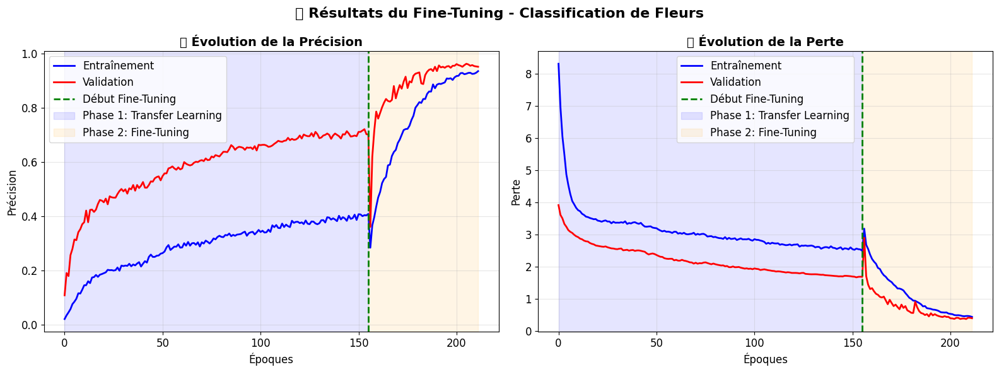


📊 Statistiques finales:
   🎯 Précision finale (entraînement): 0.9348 (93.48%)
   ✅ Précision finale (validation): 0.9510 (95.10%)
   📉 Perte finale (entraînement): 0.4467
   📊 Perte finale (validation): 0.4049

📈 Amélioration grâce au fine-tuning:
   • Précision validation: 0.7010 → 0.9510 (+25.00%)
   • Perte validation: 1.6891 → 0.4049 (-76.03%)


In [ ]:
# 📊 Affichage des courbes de performance
print("📈 Visualisation des résultats d'entraînement:")
plot_training_history(history, history_fine, "🌸 Résultats du Fine-Tuning - Classification de voitures")

### 🔍 Analyse des Résultats

Analysons ce que nous disent ces graphiques :

In [28]:
# 🔍 Analyse automatique des résultats
def analyze_training_results(history1, history2=None):
    """
    Analyse automatique des résultats d'entraînement
    """
    print("🔍 === ANALYSE DES RÉSULTATS D'ENTRAÎNEMENT ===")
    
    if history2:
        # Analyse avec fine-tuning
        val_acc_phase1 = history1.history[VAL_ACCURACY][-1]
        val_acc_phase2 = history2.history[VAL_ACCURACY][-1]
        improvement = val_acc_phase2 - val_acc_phase1
        
        print(f"\n📋 Comparaison des phases:")
        print(f"   Phase 1 (Transfer Learning): {val_acc_phase1:.4f} ({val_acc_phase1*100:.2f}%)")
        print(f"   Phase 2 (Fine-Tuning): {val_acc_phase2:.4f} ({val_acc_phase2*100:.2f}%)")
        print(f"   🚀 Amélioration: +{improvement:.4f} (+{improvement*100:.2f}%)")
        
        # Évaluation de l'amélioration
        if improvement > 0.02:
            print("   ✅ Excellent ! Le fine-tuning a significativement amélioré les performances")
        elif improvement > 0.01:
            print("   👍 Bien ! Le fine-tuning a apporté une amélioration notable")
        elif improvement > 0:
            print("   📈 Le fine-tuning a légèrement amélioré les performances")
        else:
            print("   ⚠️ Le fine-tuning n'a pas amélioré les performances (possible surapprentissage)")
    
    # Analyse du surapprentissage
    final_history = history2 if history2 else history1
    train_acc = final_history.history[ACCURACY][-1]
    val_acc = final_history.history[VAL_ACCURACY][-1]
    gap = train_acc - val_acc
    
    print(f"\n🎯 Analyse du surapprentissage:")
    print(f"   Précision entraînement: {train_acc:.4f} ({train_acc*100:.2f}%)")
    print(f"   Précision validation: {val_acc:.4f} ({val_acc*100:.2f}%)")
    print(f"   Écart: {gap:.4f} ({gap*100:.2f}%)")
    
    if gap < 0.05:
        print("   ✅ Excellent équilibre ! Pas de surapprentissage détecté")
    elif gap < 0.10:
        print("   👍 Bon équilibre, léger surapprentissage acceptable")
    elif gap < 0.15:
        print("   ⚠️ Surapprentissage modéré - pourrait être amélioré")
    else:
        print("   🚨 Surapprentissage important - réviser la régularisation")
    
    # Recommandations
    print(f"\n💡 Recommandations:")
    if gap > 0.10:
        print("   • Augmenter le dropout")
        print("   • Ajouter plus d'augmentation de données")
        print("   • Réduire le learning rate")
        print("   • Utiliser l'early stopping plus agressivement")
    
    if val_acc < 0.80:
        print("   • Essayer un modèle plus large (ResNet, EfficientNet)")
        print("   • Augmenter le nombre d'époques")
        print("   • Dégeler plus de couches")
    
    if val_acc > 0.90:
        print("   • Excellents résultats ! Le modèle est prêt pour la production")
        print("   • Considérer tester sur un dataset externe")

# Lancer l'analyse
analyze_training_results(history, history_fine)

🔍 === ANALYSE DES RÉSULTATS D'ENTRAÎNEMENT ===

📋 Comparaison des phases:
   Phase 1 (Transfer Learning): 0.7010 (70.10%)
   Phase 2 (Fine-Tuning): 0.9510 (95.10%)
   🚀 Amélioration: +0.2500 (+25.00%)
   ✅ Excellent ! Le fine-tuning a significativement amélioré les performances

🎯 Analyse du surapprentissage:
   Précision entraînement: 0.9348 (93.48%)
   Précision validation: 0.9510 (95.10%)
   Écart: -0.0162 (-1.62%)
   ✅ Excellent équilibre ! Pas de surapprentissage détecté

💡 Recommandations:
   • Excellents résultats ! Le modèle est prêt pour la production
   • Considérer tester sur un dataset externe


### 📊 Métriques Détaillées par Époque

Regardons l'évolution détaillée des métriques :

In [29]:
# 📊 Tableau détaillé des métriques
import pandas as pd

def create_metrics_table(history1, history2=None):
    """
    Crée un tableau détaillé des métriques par époque
    """
    # Préparer les données
    if history2:
        # Combiner les historiques
        epochs = list(range(1, len(history1.history[ACCURACY]) + 1))
        epochs.extend(range(len(history1.history[ACCURACY]) + 1, 
                          len(history1.history[ACCURACY]) + len(history2.history[ACCURACY]) + 1))
        
        train_acc = history1.history[ACCURACY] + history2.history[ACCURACY]
        val_acc = history1.history[VAL_ACCURACY] + history2.history[VAL_ACCURACY]
        train_loss = history1.history['loss'] + history2.history['loss']
        val_loss = history1.history['val_loss'] + history2.history['val_loss']
        
        # Marquer les phases
        phases = ['Transfer Learning'] * len(history1.history[ACCURACY])
        phases.extend(['Fine-Tuning'] * len(history2.history[ACCURACY]))
    else:
        epochs = list(range(1, len(history1.history[ACCURACY]) + 1))
        train_acc = history1.history[ACCURACY]
        val_acc = history1.history[VAL_ACCURACY]
        train_loss = history1.history['loss']
        val_loss = history1.history['val_loss']
        phases = ['Training'] * len(history1.history[ACCURACY])
    
    # Créer le DataFrame
    df = pd.DataFrame({
        'Époque': epochs,
        'Phase': phases,
        'Précision Train': [f"{acc:.4f}" for acc in train_acc],
        'Précision Val': [f"{acc:.4f}" for acc in val_acc],
        'Perte Train': [f"{loss:.4f}" for loss in train_loss],
        'Perte Val': [f"{loss:.4f}" for loss in val_loss],
        'Écart Précision': [f"{train_acc[i] - val_acc[i]:.4f}" for i in range(len(train_acc))]
    })
    
    return df

# Créer et afficher le tableau
print("📋 Tableau détaillé des métriques:")
metrics_df = create_metrics_table(history, history_fine)
print(metrics_df.to_string(index=False))

# Statistiques résumées
print("\n📊 Statistiques résumées:")
phase1_df = metrics_df[metrics_df['Phase'] == 'Transfer Learning']
phase2_df = metrics_df[metrics_df['Phase'] == 'Fine-Tuning']

if len(phase2_df) > 0:
    print(f"Phase 1 - Meilleure précision validation: {phase1_df['Précision Val'].max()}")
    print(f"Phase 2 - Meilleure précision validation: {phase2_df['Précision Val'].max()}")
    print(f"Amélioration totale: {float(phase2_df['Précision Val'].iloc[-1]) - float(phase1_df['Précision Val'].iloc[-1]):.4f}")

📋 Tableau détaillé des métriques:
 Époque             Phase Précision Train Précision Val Perte Train Perte Val Écart Précision
      1 Transfer Learning          0.0203        0.1078      8.3016    3.9149         -0.0875
      2 Transfer Learning          0.0339        0.1900      6.9515    3.6109         -0.1560
      3 Transfer Learning          0.0449        0.1789      6.0451    3.5030         -0.1340
      4 Transfer Learning          0.0570        0.2561      5.4841    3.3298         -0.1991
      5 Transfer Learning          0.0754        0.2794      4.8715    3.2444         -0.2040
      6 Transfer Learning          0.0843        0.3137      4.5410    3.1398         -0.2295
      7 Transfer Learning          0.0953        0.3113      4.2617    3.0874         -0.2160
      8 Transfer Learning          0.1154        0.3407      4.0425    3.0522         -0.2253
      9 Transfer Learning          0.1143        0.3517      3.9393    2.9944         -0.2374
     10 Transfer Learning 

## 🎯 Évaluation et Prédictions du Modèle

Maintenant que notre modèle est entraîné, évaluons ses performances et voyons comment il fait des prédictions sur de nouvelles images.

### 📊 Pourquoi Évaluer ?

L'évaluation nous permet de :
- **Mesurer les performances réelles** sur des données non vues
- **Identifier les erreurs** de classification
- **Comprendre les forces et faiblesses** du modèle
- **Valider l'utilisabilité** en production

In [62]:
# 📊 Évaluation finale du modèle
print("🎯 === ÉVALUATION FINALE DU MODÈLE ===")
print("\n📋 Évaluation sur le dataset de validation...")

# Évaluation détaillée
test_loss, test_acc = model.evaluate(ds_val_processed, verbose=1)

print(f"\n✅ Résultats finaux:")
print(f"   📉 Perte finale: {test_loss:.4f}")
print(f"   🎯 Précision finale: {test_acc:.4f} ({test_acc*100:.2f}%)")

# Interprétation des résultats
if test_acc >= 0.95:
    print("   🌟 Excellente performance ! Modèle prêt pour la production")
    model.save('history_fine.keras')
elif test_acc >= 0.90:
    print("   🎉 Très bonne performance ! Résultats impressionnants")
elif test_acc >= 0.80:
    print("   👍 Bonne performance, utilisable dans la plupart des cas")
elif test_acc >= 0.70:
    print("   📈 Performance correcte, peut être améliorée")
else:
    print("   ⚠️ Performance à améliorer, réviser l'approche")

🎯 === ÉVALUATION FINALE DU MODÈLE ===

📋 Évaluation sur le dataset de validation...
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 528ms/step - loss: 0.3943 - sparse_categorical_accuracy: 0.9477

✅ Résultats finaux:
   📉 Perte finale: 0.3803
   🎯 Précision finale: 0.9571 (95.71%)
   🌟 Excellente performance ! Modèle prêt pour la production


### 🔍 Analyse des Prédictions

Regardons comment notre modèle fait ses prédictions sur des exemples concrets :

🔍 Prédictions sur le dataset de validation:


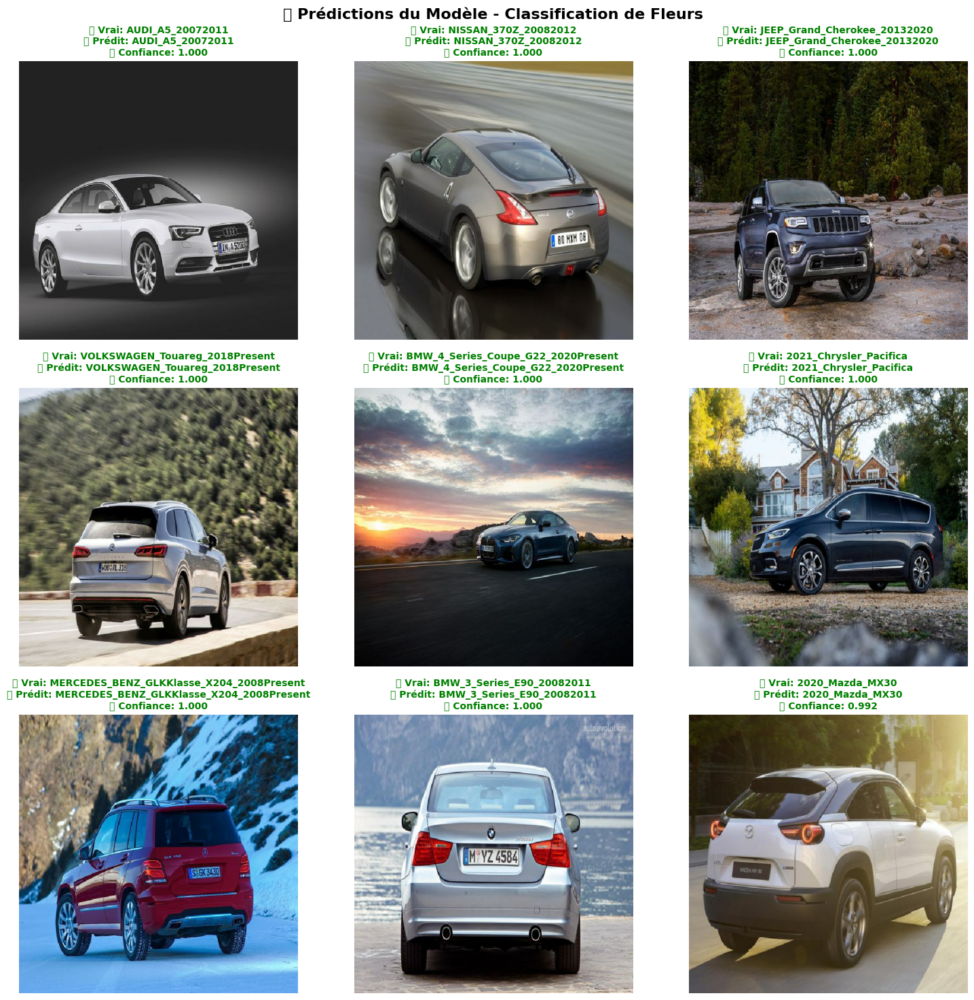


📊 Statistiques sur ce batch:
   🎯 Précision: 9/9 (100.0%)
   📈 Confiance moyenne: 0.999 (99.9%)
   🔍 Confiance min/max: 0.992 / 1.000

💡 Comment interpréter ces résultats ?
   ✅ Prédictions correctes en VERT
   ❌ Prédictions incorrectes en ROUGE
   📊 La confiance indique la certitude du modèle (0-1)
   🎯 Une confiance > 0.8 indique une prédiction très fiable


In [ ]:
def predict_and_show(dataset, model, num_images=9, figsize=(15, 15)):
    """
    Affiche des prédictions du modèle avec analyse détaillée
    
    Args:
        dataset: Dataset de validation
        model: Modèle entraîné
        num_images: Nombre d'images à afficher
        figsize: Taille de la figure
    """
    plt.figure(figsize=figsize)
    plt.suptitle("🔍 Prédictions du Modèle - Classification de voitures", 
                 fontsize=16, fontweight='bold')
    
    # Statistiques pour l'analyse
    correct_predictions = 0
    total_predictions = 0
    confidence_scores = []
    
    for images, labels in dataset.take(1):
        # Faire les prédictions
        predictions = model.predict(images, verbose=0)
        
        for i in range(min(num_images, len(images))):
            ax = plt.subplot(3, 3, i + 1)
            
            # Préparer l'image pour l'affichage
            image = images[i].numpy()
            # # Dénormaliser de [-1, 1] vers [0, 1]
            image = image / 255
            plt.imshow(image)
            
            # Analyser la prédiction
            pred_probs = predictions[i]
            pred_label = np.argmax(pred_probs)
            true_label = labels[i].numpy()
            confidence = pred_probs[pred_label]
            
            # Statistiques
            total_predictions += 1
            confidence_scores.append(confidence)
            if pred_label == true_label:
                correct_predictions += 1
            
            # Couleur selon la justesse de la prédiction
            color = 'green' if pred_label == true_label else 'red'
            
            # Titre avec informations détaillées
            true_name = class_names[true_label]
            pred_name = class_names[pred_label]
            
            title = f"✅ Vrai: {true_name}\n🎯 Prédit: {pred_name}\n📊 Confiance: {confidence:.3f}"
            if pred_label != true_label:
                title = f"❌ Vrai: {true_name}\n🎯 Prédit: {pred_name}\n📊 Confiance: {confidence:.3f}"
            
            plt.title(title, fontsize=10, color=color, fontweight='bold')
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Afficher les statistiques
    accuracy = correct_predictions / total_predictions
    avg_confidence = np.mean(confidence_scores)
    
    print(f"\n📊 Statistiques sur ce batch:")
    print(f"   🎯 Précision: {correct_predictions}/{total_predictions} ({accuracy*100:.1f}%)")
    print(f"   📈 Confiance moyenne: {avg_confidence:.3f} ({avg_confidence*100:.1f}%)")
    print(f"   🔍 Confiance min/max: {min(confidence_scores):.3f} / {max(confidence_scores):.3f}")
    
    return correct_predictions, total_predictions, confidence_scores

print("🔍 Prédictions sur le dataset de validation:")
correct, total, confidences = predict_and_show(ds_val_processed, model)

print("\n💡 Comment interpréter ces résultats ?")
print("   ✅ Prédictions correctes en VERT")
print("   ❌ Prédictions incorrectes en ROUGE")
print("   📊 La confiance indique la certitude du modèle (0-1)")
print("   🎯 Une confiance > 0.8 indique une prédiction très fiable")

### 📊 Matrice de Confusion

La matrice de confusion nous montre en détail quelles classes sont confondues par le modèle :

📊 Création de la matrice de confusion...


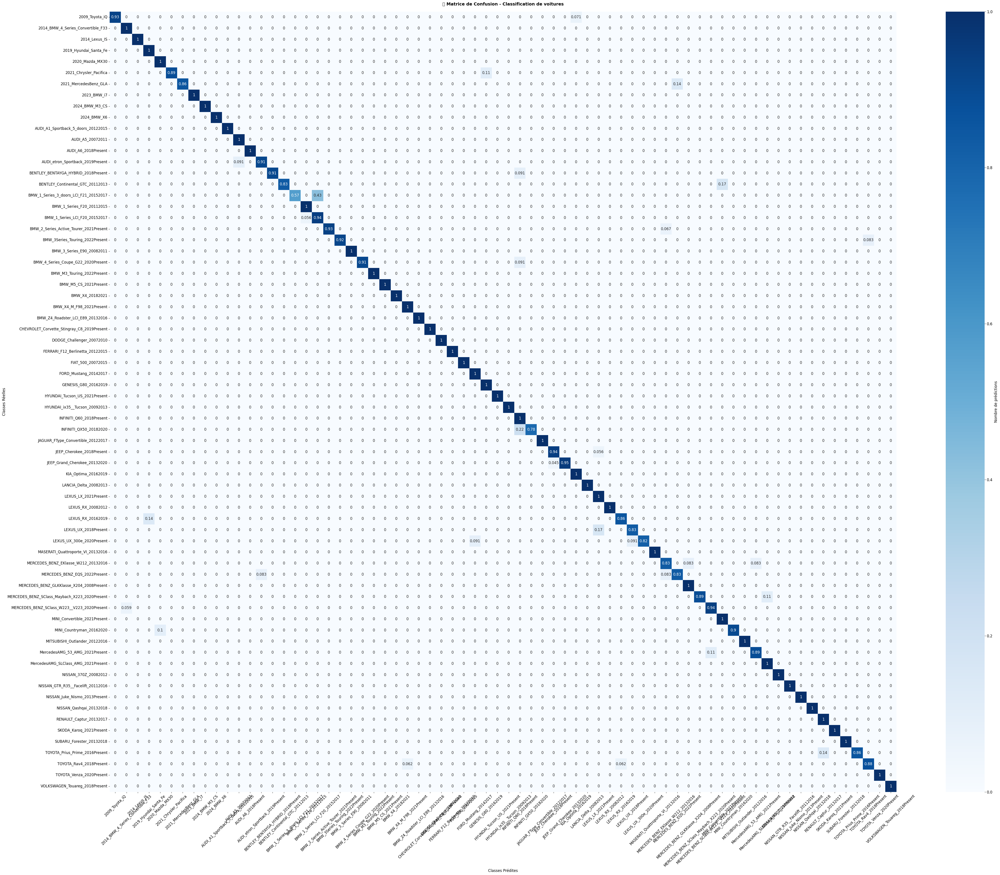


🔍 Analyse de la matrice de confusion:
   🌺 2009_Toyota_iQ: 0.9285714285714286/1.0 (92.9%)
   🌺 2014_BMW_4_Series_Convertible_F33: 1.0/1.0 (100.0%)
   🌺 2014_Lexus_IS: 1.0/1.0 (100.0%)
   🌺 2019_Hyundai_Santa_Fe: 1.0/1.0 (100.0%)
   🌺 2020_Mazda_MX30: 1.0/1.0 (100.0%)
   🌺 2021_Chrysler_Pacifica: 0.8888888888888888/1.0 (88.9%)
   🌺 2021_MercedesBenz_GLA: 0.8571428571428571/1.0 (85.7%)
   🌺 2023_BMW_i7: 1.0/1.0 (100.0%)
   🌺 2024_BMW_M3_CS: 1.0/1.0 (100.0%)
   🌺 2024_BMW_X6: 1.0/1.0 (100.0%)
   🌺 AUDI_A1_Sportback_5_doors_20122015: 1.0/1.0 (100.0%)
   🌺 AUDI_A5_20072011: 1.0/1.0 (100.0%)
   🌺 AUDI_A6_2018Present: 1.0/1.0 (100.0%)
   🌺 AUDI_etron_Sportback_2019Present: 0.9090909090909091/1.0 (90.9%)
   🌺 BENTLEY_BENTAYGA_HYBRID_2018Present: 0.9090909090909091/1.0 (90.9%)
   🌺 BENTLEY_Continental_GTC_20112013: 0.8333333333333334/1.0 (83.3%)
   🌺 BMW_1_Series_3_doors_LCI_F21_20152017: 0.5714285714285714/1.0 (57.1%)
   🌺 BMW_1_Series_F20_20112015: 1.0/1.0 (100.0%)
   🌺 BMW_1_Series_LCI_F20_

In [17]:
from sklearn.metrics import confusion_matrix, classification_report
import math
import seaborn as sns
import pandas as pd
import tensorflow as tf
import numpy as np

def create_confusion_matrix(dataset, model):
    """
    Crée et affiche la matrice de confusion
    """
    print("📊 Création de la matrice de confusion...")
    
    # Collecter toutes les prédictions et vraies étiquettes
    all_predictions = []
    all_true_labels = []
    
    for images, labels in dataset:
        # Prédictions du modèle
        predictions = model.predict(images, verbose=0)
        pred_labels = np.argmax(predictions, axis=1)
        
        # Stocker les résultats
        all_predictions.extend(pred_labels)
        all_true_labels.extend(labels.numpy())
    
    # Créer la matrice de confusion
    cm = confusion_matrix(all_true_labels , all_predictions, normalize='true')
    
    # Visualisation
    plt.figure(figsize=(50, 40))
    sns.heatmap(cm, annot=True, fmt='.2g', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Nombre de prédictions'})
    
    plt.title('📊 Matrice de Confusion - Classification de voitures', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Classes Prédites', fontsize=12)
    plt.ylabel('Classes Réelles', fontsize=12)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Analyse de la matrice
    print("\n🔍 Analyse de la matrice de confusion:")
    
    # Précision par classe
    for i, class_name in enumerate(class_names):
        # Vrais positifs (diagonal)
        tp = cm[i, i]
        # Tous les exemples de cette classe
        total_class = np.sum(cm[i, :])
        # Précision pour cette classe
        class_accuracy = tp / total_class if total_class > 0 else 0
        
        print(f"   🌺 {class_name}: {tp}/{total_class} ({class_accuracy*100:.1f}%)")
    
    # Identifier les confusions les plus fréquentes
    print("\n⚠️ Confusions les plus fréquentes:")
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            if i != j and cm[i, j] > 0:
                confusion_rate = cm[i, j] / np.sum(cm[i, :]) * 100
                if confusion_rate > 10:  # Seulement les confusions > 10%
                    print(f"   🔄 {class_names[i]} → {class_names[j]}: {cm[i, j]} cas ({confusion_rate:.1f}%)")
    
    # Rapport de classification détaillé
    print("\n📋 Rapport de classification détaillé:")
    report = classification_report(all_true_labels, all_predictions, 
                                 target_names=class_names, digits=4)
    print(report)
    
    return cm, all_true_labels, all_predictions

model = tf.keras.models.load_model('history_fine.keras', compile=False)

# Créer la matrice de confusion
conf_matrix, true_labels, pred_labels = create_confusion_matrix(ds_val_processed, model)

### 🎯 Analyse des Erreurs

Regardons en détail les cas où le modèle se trompe pour comprendre ses limites :

🔍 Analyse des erreurs de classification...


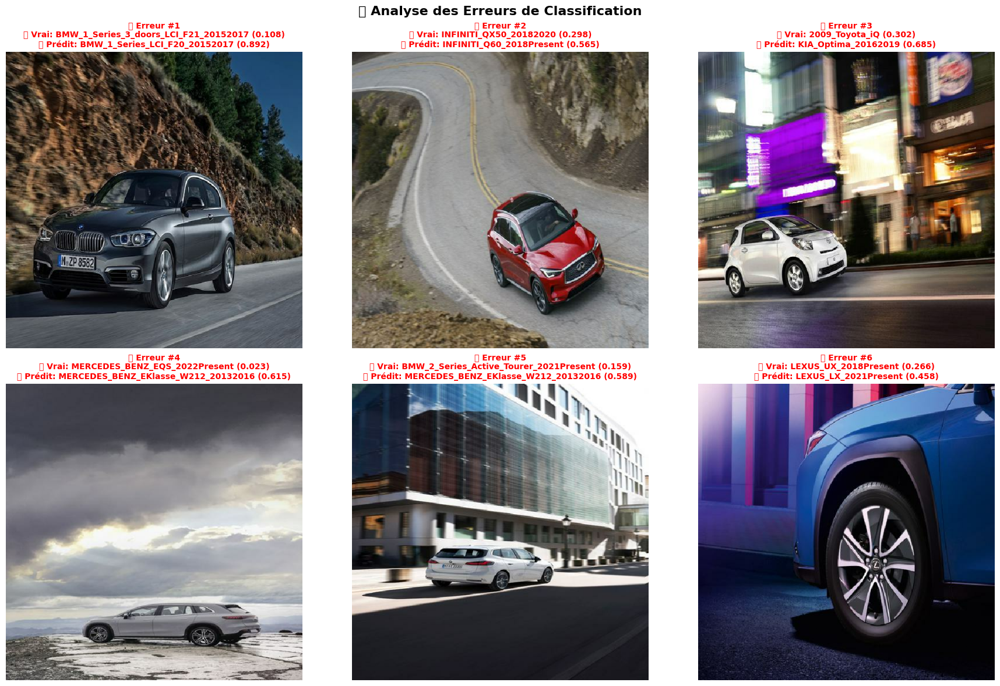


📊 Analyse de 6 erreurs:
   📈 Confiance moyenne des prédictions erronées: 0.634
   📉 Confiance moyenne des vraies classes: 0.193
   📊 Différence de confiance: 0.441

🔄 Types d'erreurs les plus fréquents:
   • BMW_1_Series_3_doors_LCI_F21_20152017 → BMW_1_Series_LCI_F20_20152017: 1 cas
   • INFINITI_QX50_20182020 → INFINITI_Q60_2018Present: 1 cas
   • 2009_Toyota_iQ → KIA_Optima_20162019: 1 cas
   • MERCEDES_BENZ_EQS_2022Present → MERCEDES_BENZ_EKlasse_W212_20132016: 1 cas
   • BMW_2_Series_Active_Tourer_2021Present → MERCEDES_BENZ_EKlasse_W212_20132016: 1 cas
   • LEXUS_UX_2018Present → LEXUS_LX_2021Present: 1 cas

💡 Conseils pour améliorer le modèle:
   🔍 Examinez les erreurs pour identifier les patterns
   📊 Les classes souvent confondues nécessitent plus de données
   🎲 L'augmentation de données peut aider pour les cas difficiles
   🧠 Un modèle plus complexe peut distinguer les cas subtils


In [33]:
def analyze_errors(dataset, model, max_errors=6):
    """
    Analyse et affiche les erreurs de classification
    """
    print("🔍 Analyse des erreurs de classification...")
    
    errors_found = []
    
    # Chercher des erreurs dans le dataset
    for images, labels in dataset:
        if len(errors_found) >= max_errors:
            break
            
        predictions = model.predict(images, verbose=0)
        pred_labels = np.argmax(predictions, axis=1)
        
        for i in range(len(images)):
            if len(errors_found) >= max_errors:
                break
                
            if pred_labels[i] != labels[i]:
                errors_found.append({
                    'image': images[i],
                    'true_label': labels[i].numpy(),
                    'pred_label': pred_labels[i],
                    'confidence': predictions[i][pred_labels[i]],
                    'true_confidence': predictions[i][labels[i]],
                    'all_probs': predictions[i]
                })
    
    if not errors_found:
        print("🎉 Aucune erreur trouvée dans ce batch ! Modèle parfait sur ces exemples.")
        return
    
    # Affichage des erreurs
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle("❌ Analyse des Erreurs de Classification", fontsize=16, fontweight='bold')
    
    for idx, error in enumerate(errors_found[:6]):
        row = idx // 3
        col = idx % 3
        ax = axes[row, col]
        
        # Afficher l'image
        image = error['image'].numpy()
        image = image / 255
        ax.imshow(image)
        
        # Informations sur l'erreur
        true_name = class_names[error['true_label']]
        pred_name = class_names[error['pred_label']]
        
        title = f"❌ Erreur #{idx+1}\n"
        title += f"✅ Vrai: {true_name} ({error['true_confidence']:.3f})\n"
        title += f"🎯 Prédit: {pred_name} ({error['confidence']:.3f})"
        
        ax.set_title(title, fontsize=10, color='red', fontweight='bold')
        ax.axis('off')
    
    # Cacher les sous-graphiques vides
    for idx in range(len(errors_found), 6):
        row = idx // 3
        col = idx % 3
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Analyse statistique des erreurs
    print(f"\n📊 Analyse de {len(errors_found)} erreurs:")
    
    # Confiance moyenne des erreurs
    avg_error_confidence = np.mean([e['confidence'] for e in errors_found])
    avg_true_confidence = np.mean([e['true_confidence'] for e in errors_found])
    
    print(f"   📈 Confiance moyenne des prédictions erronées: {avg_error_confidence:.3f}")
    print(f"   📉 Confiance moyenne des vraies classes: {avg_true_confidence:.3f}")
    print(f"   📊 Différence de confiance: {avg_error_confidence - avg_true_confidence:.3f}")
    
    # Types d'erreurs
    error_types = {}
    for error in errors_found:
        true_class = class_names[error['true_label']]
        pred_class = class_names[error['pred_label']]
        error_type = f"{true_class} → {pred_class}"
        error_types[error_type] = error_types.get(error_type, 0) + 1
    
    print("\n🔄 Types d'erreurs les plus fréquents:")
    for error_type, count in sorted(error_types.items(), key=lambda x: x[1], reverse=True):
        print(f"   • {error_type}: {count} cas")
    
    return errors_found

# Analyser les erreurs
errors = analyze_errors(ds_val_processed, model)

print("\n💡 Conseils pour améliorer le modèle:")
print("   🔍 Examinez les erreurs pour identifier les patterns")
print("   📊 Les classes souvent confondues nécessitent plus de données")
print("   🎲 L'augmentation de données peut aider pour les cas difficiles")
print("   🧠 Un modèle plus complexe peut distinguer les cas subtils")

## 🎓 Conseils et Bonnes Pratiques

### 📚 Ce que Nous Avons Appris

À travers ce projet, nous avons exploré :

✅ **Transfer Learning** : Utilisation d'un modèle pré-entraîné

✅ **Fine-Tuning** : Ajustement fin en deux phases

✅ **Data Augmentation** : Enrichissement artificiel des données

✅ **Évaluation** : Mesure des performances et analyse des erreurs

✅ **Visualisation** : Compréhension des résultats par les graphiques

### 🚀 Conseils pour Améliorer Vos Modèles

#### 1. 🎯 Choix du Modèle Pré-entraîné

**Pour applications mobiles :**
- MobileNet, MobileNetV2, MobileNetV3
- EfficientNet (bon compromis taille/performance)

**Pour performances maximales :**
- ResNet50, ResNet101
- EfficientNet-B4, B5, B7
- Vision Transformers (ViT)

**Pour données médicales :**
- Modèles pré-entraînés sur ImageNet médical
- Modèles spécialisés (RadImageNet, etc.)

#### 2. 🎲 Stratégies d'Augmentation de Données

**Augmentations géométriques :**
```python
# Basiques
layers.RandomFlip("horizontal_and_vertical")
layers.RandomRotation(0.3)
layers.RandomZoom(0.2)
layers.RandomTranslation(0.1, 0.1)

# Avancées
layers.RandomContrast(0.2)
layers.RandomBrightness(0.2)
```

**Augmentations spécialisées :**
- **Photos de nature** : Variations de luminosité, contraste
- **Images médicales** : Attention aux rotations (peut changer le diagnostic)
- **Texte/Documents** : Rotations légères, perspective

#### 3. 🔧 Stratégies de Fine-Tuning

**Dégel progressif :**
```python
# Phase 1: Tout gelé
base_model.trainable = False

# Phase 2: Dégeler les dernières couches
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Phase 3: Dégeler plus de couches si nécessaire
for layer in base_model.layers[-50:]:
    layer.trainable = True
```

**Learning rates adaptatifs :**
```python
# LR différents pour différentes parties
optimizer = tf.keras.optimizers.Adam([
    {'params': base_model.layers[-10:], 'lr': 1e-5},
    {'params': new_layers, 'lr': 1e-4}
])
```

#### 4. 📊 Régularisation Avancée

**Dropout adaptatif :**
```python
# Plus de dropout pour les couches plus larges
x = layers.Dropout(0.3)(x)  # Après GlobalAveragePooling
x = layers.Dense(512)(x)
x = layers.Dropout(0.5)(x)  # Avant la couche finale
```

**Weight decay :**
```python
# L2 regularization
layers.Dense(num_classes, 
            kernel_regularizer=tf.keras.regularizers.l2(0.01))
```

#### 5. ⚡ Optimisation des Performances

**Mixed Precision Training :**
```python
# Pour GPUs modernes
policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)
```

**Pipeline de données optimisé :**
```python
dataset = dataset.cache()  # Cache en mémoire
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size)
dataset = dataset.prefetch(tf.data.AUTOTUNE)
```

### ⚠️ Erreurs Courantes à Éviter

#### 🚨 Erreurs de Données
- **Data leakage** : Même image dans train et validation
- **Déséquilibre des classes** : Pas assez d'exemples pour certaines classes
- **Qualité des labels** : Erreurs d'étiquetage

#### 🚨 Erreurs d'Entraînement
- **Learning rate trop élevé** : Le modèle n'apprend pas
- **Learning rate trop faible** : Entraînement trop lent
- **Pas assez d'époques** : Sous-apprentissage
- **Trop d'époques** : Surapprentissage

#### 🚨 Erreurs d'Évaluation
- **Évaluer sur le train** : Surestimation des performances
- **Pas de test set** : Pas de mesure finale objective
- **Optimiser sur la validation** : Biais de sélection

### 🎯 Prochaines Étapes

Pour aller plus loin :

1. **🔬 Expérimentez** avec d'autres architectures
2. **📊 Collectez plus de données** pour améliorer les performances
3. **🎲 Testez différentes augmentations** spécifiques à votre domaine
4. **⚡ Optimisez pour la production** (quantization, pruning)
5. **🚀 Déployez votre modèle** (TensorFlow Serving, TensorFlow Lite)

### 📚 Ressources Supplémentaires

- **Documentation TensorFlow** : [tensorflow.org](https://tensorflow.org)
- **Papers avec Code** : [paperswithcode.com](https://paperswithcode.com)
- **TensorFlow Hub** : Modèles pré-entraînés
- **Keras Applications** : Architectures populaires

---

